# Описание проекта

Подготовка прототипа модели машинного обучения для «Цифры». Компания разрабатывает решения для эффективной работы промышленных предприятий.

Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды. В нашем распоряжении данные с параметрами добычи и очистки. 

Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.

Краткий план работы:

1. Подготовить данные;
2. Провести исследовательский анализ данных;
3. Построить и обучить модель.

## Описание данных

#### Технологический процесс
- Rougher feed — исходное сырье
- Rougher additions (или reagent additions) — флотационные реагенты: Xanthate, Sulphate, Depressant
- Xanthate — ксантогенат (промотер, или активатор флотации);
- Sulphate — сульфат (на данном производстве сульфид натрия);
- Depressant — депрессант (силикат натрия).
- Rougher process — флотация
- Rougher tails — отвальные хвосты
- Float banks — флотационная установка
- Cleaner process — очистка
- Rougher Au — черновой концентрат золота
- Final Au — финальный концентрат золота

#### Параметры этапов
- air amount — объём воздуха
- fluid levels — уровень жидкости
- feed size — размер гранул сырья
- feed rate — скорость подачи

# 1. Подготовка данных

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.feature_selection import SelectKBest, RFE
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, make_scorer
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.dummy import DummyRegressor
from sklearn.preprocessing import StandardScaler

In [2]:
full = pd.read_csv('/home/konstantin/datasets/gold_recovery_full.csv')
gold_train = pd.read_csv('/home/konstantin/datasets/gold_recovery_train.csv')
gold_test = pd.read_csv('/home/konstantin/datasets/gold_recovery_test.csv')

Посмотрим размерность выборок

In [3]:
print(full.shape)
print(gold_train.shape)
print(gold_test.shape)

(22716, 87)
(16860, 87)
(5856, 53)


In [4]:
gold_test = gold_test.merge(full[['date', 'rougher.output.recovery', 'final.output.recovery']], on='date')

In [5]:
gold_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                16860 non-null  object 
 1   final.output.concentrate_ag                         16788 non-null  float64
 2   final.output.concentrate_pb                         16788 non-null  float64
 3   final.output.concentrate_sol                        16490 non-null  float64
 4   final.output.concentrate_au                         16789 non-null  float64
 5   final.output.recovery                               15339 non-null  float64
 6   final.output.tail_ag                                16794 non-null  float64
 7   final.output.tail_pb                                16677 non-null  float64
 8   final.output.tail_sol                               16715 non-null  float64


In [6]:
pd.set_option('display.max_rows', 90)
gold_train.isnull().sum().sort_values(ascending=False)

rougher.output.recovery                               2573
rougher.output.tail_ag                                2250
rougher.output.tail_sol                               2249
rougher.output.tail_au                                2249
secondary_cleaner.output.tail_sol                     1986
rougher.input.floatbank11_xanthate                    1904
final.output.recovery                                 1521
primary_cleaner.input.sulfate                         1307
primary_cleaner.input.depressant                      1262
rougher.calculation.au_pb_ratio                       1242
rougher.input.floatbank10_sulfate                     1044
primary_cleaner.input.xanthate                         985
primary_cleaner.output.concentrate_sol                 636
rougher.input.floatbank11_sulfate                      623
rougher.state.floatbank10_e_air                        603
rougher.input.feed_rate                                513
rougher.input.feed_size                                4

Во всех колонках, кроме двух, имеются пропуски, где-то их сравнительно немного, где-то они занимают до 15% датасета и выше. Заполнить пропуски можно, например, используя какой-нибудь простой imputer, либо метод ffill (т.к. наблюдения расположены хронологически)

Больше всего пропусков по эффективности обогащения флотационной установке, тут можно рассчитать по формуле (то же справедливо и для этапов очистки).

__Проверим расчет эффективности обогащения для флотационной установки.__
Сравнивать будем с обучающей выборкой (пока без заполнения пропуска в данных). Признак - rougher.output.recovery

Нам потребуются: 

- C — доля золота в концентрате после флотации. Признак - rougher.output.concentrate_au
- F — доля золота в сырье до флотации/очистки. Признак - rougher.input.feed_au
- T — доля золота в отвальных хвостах после флотации. Признак - rougher.output.tail_au

In [7]:
print(gold_train['rougher.output.concentrate_au'].isnull().sum())
print(gold_train['rougher.input.feed_au'].isnull().sum())
print(gold_train['rougher.output.tail_au'].isnull().sum())
print(gold_train['rougher.output.recovery'].isnull().sum())

82
83
2249
2573


Думаю, для проверки можно просто откинуть пропуски.

In [8]:
def CalcRecovery(row):
    C = row['rougher.output.concentrate_au']
    F = row['rougher.input.feed_au']
    T = row['rougher.output.tail_au']
    try:
        out = C*(F-T) / (F*(C-T)) * 100
    except ZeroDivisionError:
        out = 0
    return out

In [9]:
rec_test = gold_train[['rougher.output.concentrate_au', 'rougher.input.feed_au', 'rougher.output.tail_au',\
                       'rougher.output.recovery']].dropna()
rec_result = rec_test.apply(CalcRecovery, axis=1)
print(mean_absolute_error(rec_test['rougher.output.recovery'], rec_result))

9.444891926100695e-15


Ошибка близка к нулю, следовательно, эффективность обогащения рассчитана правильно

Рассмотрим данные из тестовой выборки. Выберем признаки, которые есть только в обучающей выборке

In [10]:
absent_in_test = [element for element in gold_train.columns if element not in gold_test.columns]
absent_in_test

['final.output.concentrate_ag',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.concentrate_au',
 'final.output.tail_ag',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'final.output.tail_au',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'primary_cleaner.output.tail_au',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.au_pb_ratio',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.concentrate_au',
 'rougher.output.tail_ag',
 'rougher.output.tail_pb',
 'rougher.output.tail_sol',
 'rougher.output.tail_au',
 'secondary_cleane

Видим, что в тестовых данных отсутствуют в основном лишь выходные параметры продукта (на разных этапах), а также несколько расчетных характеристик. Эти данные отсутствуют ввиду того, что в реальности это сырье еще не перерабатывалось

In [11]:
gold_train.isnull().sum()

date                                                     0
final.output.concentrate_ag                             72
final.output.concentrate_pb                             72
final.output.concentrate_sol                           370
final.output.concentrate_au                             71
final.output.recovery                                 1521
final.output.tail_ag                                    66
final.output.tail_pb                                   183
final.output.tail_sol                                  145
final.output.tail_au                                    66
primary_cleaner.input.sulfate                         1307
primary_cleaner.input.depressant                      1262
primary_cleaner.input.feed_size                          0
primary_cleaner.input.xanthate                         985
primary_cleaner.output.concentrate_ag                   82
primary_cleaner.output.concentrate_pb                  358
primary_cleaner.output.concentrate_sol                 6

<AxesSubplot:>

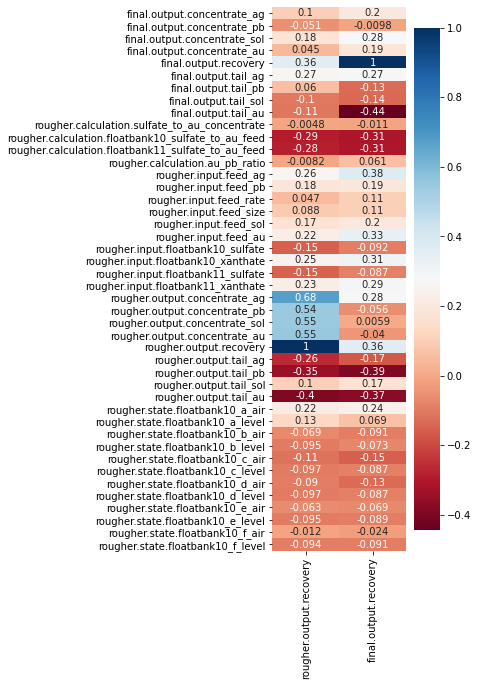

In [12]:
rougher_data = gold_train.dropna()
rougher_data=rougher_data[[column for column in rougher_data.columns if 'rougher' in column or 'final' in column]]
corr_mrx = rougher_data.corr()
plt.figure(figsize = (3,10))
sns.heatmap(corr_mrx.loc[:, ['rougher.output.recovery', 'final.output.recovery']], cmap = 'RdBu', cbar = True, annot=True)

Данных даже сейчас многовато, но уже видно, что сильной корреляции между эффективностью обогащения флотационной установки и каким-либо из входных признаков нет (final не влез)

Впрочем, для признаков металлов в сырья тоже существует ковариация, но она несколько менее выражена.

In [13]:
pd.set_option('display.max_columns', 90)
gold_train.describe()

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
count,16788.000000,16788.000000,16490.000000,16789.000000,15339.000000,16794.000000,16677.000000,16715.000000,16794.000000,15553.000000,15598.000000,16860.000000,15875.000000,16778.000000,16502.000000,16224.000000,16778.000000,16777.000000,16761.000000,16579.000000,16777.000000,16820.000000,16827.000000,16820.000000,16833.000000,16822.000000,16833.000000,16821.000000,16833.000000,1.683300e+04,1.683300e+04,1.683300e+04,15618.000000,16778.000000,16632.000000,16347.000000,16443.000000,16568.000000,16777.000000,15816.000000,16514.000000,16237.000000,14956.000000,16778.000000,16778.000000,16698.000000,16778.000000,14287.000000,14610.000000,16778.000000,14611.000000,14611.000000,16807.000000,16807.000000,16807.000000,16807.000000,16807.000000,16814.000000,16802.000000,16809.000000,16257.000000,16809.000000,16802.000000,16802.000000,16776.000000,16764.000000,14874.000000,16778.000000,16497.000000,16751.000000,16705.000000,16748.000000,16763.000000,16747.000000,16752.000000,16750.000000,16731.000000,16747.000000,16768.000000,16767.000000,16775.000000,16775.000000,16775

Здесь очень сложно среди такого большого количества признаков искать аномалии. Но все же попробуем написать функцию для фильтрации. Будем учитывать следующее:

1) Объем воздуха в установках не может быть отрицательным

2) Казалось бы, уровень жидкости тоже не должен быть меньше нуля, но в большинстве случаев именно так и происходит, поэтому пока оставим как есть. Возможно, используется некий относительный уровень

3) Остальные признаки более-менее в норме на первый взгляд

4) Уберем признаки, не содержащиеся в тестовой выборке

5) Убираем строки, где пропущен целевой признак (пользы от них все равно никакой)

5) Пропуски в данных заполним по среднему или методом ffill

In [14]:
def FilterRows(df, is_test=False):
    air_col = [column for column in df.columns if 'air' in column]
    def IterOverRows(row):
        for col in air_col:
            if row[col] < 0:
                return None
        return row
    
    # тут убираем строки с низкими концентрациями веществ из графика НИЖЕ
    df = df[(df['rougher.input.feed_au'] + df['rougher.input.feed_ag'] + df['rougher.input.feed_pb']) > 1]
    
    if not is_test: # ТОЛЬКО для обучающей выборки
        df = df[(df['rougher.output.concentrate_au'] + df['rougher.output.concentrate_ag']\
                                                     + df['rougher.output.concentrate_pb'])>1]
        df = df[(df['primary_cleaner.output.concentrate_au'] + df['primary_cleaner.output.concentrate_ag'] + \
             df['primary_cleaner.output.concentrate_pb']) > 1]
        df = df[(df['final.output.concentrate_au'] + df['final.output.concentrate_ag']\
                                                   + df['final.output.concentrate_pb']) > 1]
    df = df[df['rougher.input.feed_size'] > 25]

    df = df.dropna(subset=['rougher.output.recovery', 'final.output.recovery']) # полный сброс строк, где пропущен таргет
    df = df.apply(IterOverRows, axis=1) # на выходе NaN, если не удовлетворяет условию
    df = df.dropna(subset=air_col) # сброс полученных выше строк
    df_new = df.loc[:, [column for column in df.columns if column not in absent_in_test]]
    df_new = df_new.fillna(method='ffill') # заполняем по времени, т.к. соседние по времени параметры часто похожи
    return df_new 

In [15]:
train_cleaned= FilterRows(gold_train)
test_cleaned = FilterRows(gold_test, is_test=True)

## Вывод:

Признаков в данных очень много, сильной корреляции между эффективностью обогащения и каким-либо из входных признаков нет (видим положительные корреляции с концентрациями металлов в выходном продукте и отрицательные с концентрациями металлов в отвальных хвостах, но все это не имеет значения, по сути это ковариация). Отбросили признаки, отсутствующие в тестовых данных. Мы не можем их использовать при обучении модели, поскольку данные о них становятся доступны уже в ходе работы (т.к. процесс обработки состоит из нескольких этапов, например, данные на вход установок очистки попадают после завершения флотации).

# 2. Анализ данных

 Посмотрим, как меняется концентрация металлов (золото, серебро, свинец) на различных этапах очистки

In [16]:
drawable = gold_train.dropna() # это отдельный df исключительно для построения графиков

In [17]:
# Золото
y1 = [drawable['rougher.input.feed_au'].mean(), drawable['rougher.output.concentrate_au'].mean(),
     drawable['primary_cleaner.output.concentrate_au'].mean(), drawable['final.output.concentrate_au'].mean()]
y1_mins = [drawable['rougher.input.feed_au'].quantile(.025), drawable['rougher.output.concentrate_au'].quantile(.025),
     drawable['primary_cleaner.output.concentrate_au'].quantile(.025), drawable['final.output.concentrate_au'].quantile(.025)]
y1_maxs = [drawable['rougher.input.feed_au'].quantile(.975), drawable['rougher.output.concentrate_au'].quantile(.975),
     drawable['primary_cleaner.output.concentrate_au'].quantile(.975), drawable['final.output.concentrate_au'].quantile(.975)]

# Серебро
y2 = [drawable['rougher.input.feed_ag'].mean(), drawable['rougher.output.concentrate_ag'].mean(),
     drawable['primary_cleaner.output.concentrate_ag'].mean(), drawable['final.output.concentrate_ag'].mean()]
y2_mins = [drawable['rougher.input.feed_ag'].quantile(.025), drawable['rougher.output.concentrate_ag'].quantile(.025),
     drawable['primary_cleaner.output.concentrate_ag'].quantile(.025), drawable['final.output.concentrate_ag'].quantile(.025)]
y2_maxs = [drawable['rougher.input.feed_ag'].quantile(.975), drawable['rougher.output.concentrate_ag'].quantile(.975),
     drawable['primary_cleaner.output.concentrate_ag'].quantile(.975), drawable['final.output.concentrate_ag'].quantile(.975)]

# Свинец
y3 = [drawable['rougher.input.feed_pb'].mean(), drawable['rougher.output.concentrate_pb'].mean(),
     drawable['primary_cleaner.output.concentrate_pb'].mean(), drawable['final.output.concentrate_pb'].mean()]
y3_mins = [drawable['rougher.input.feed_pb'].quantile(.025), drawable['rougher.output.concentrate_pb'].quantile(.025),
     drawable['primary_cleaner.output.concentrate_pb'].quantile(.025), drawable['final.output.concentrate_pb'].quantile(.025)]
y3_maxs = [drawable['rougher.input.feed_pb'].quantile(.975), drawable['rougher.output.concentrate_pb'].quantile(.975),
     drawable['primary_cleaner.output.concentrate_pb'].quantile(.975), drawable['final.output.concentrate_pb'].quantile(.975)]

In [18]:
x=[1,2,3,4]

Закрашенные области - в них попадает 95% данных

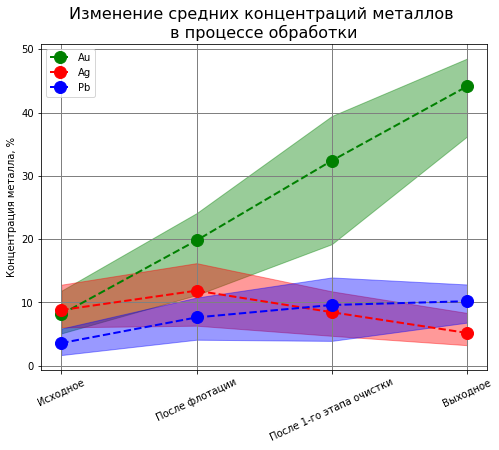

In [19]:
plt.figure(figsize=(8,6))
plt.plot(x, y1, label='Au', color='green', marker='o', linestyle='dashed', linewidth=2, markersize=12)
plt.fill_between(x, y1_mins, y1_maxs, color='green', alpha=0.4)
plt.plot(x, y2, label='Ag', color='red', marker='o', linestyle='dashed', linewidth=2, markersize=12)
plt.fill_between(x, y2_mins, y2_maxs, color='red', alpha=0.4)
plt.plot(x, y3, label='Pb', color='blue', marker='o', linestyle='dashed', linewidth=2, markersize=12)
plt.fill_between(x, y3_mins, y3_maxs, color='blue', alpha=0.4)
plt.legend()
plt.xticks([1,2,3,4], labels=['Исходное', 'После флотации', 'После 1-го этапа очистки', 'Выходное'], rotation=25)
plt.grid(which='major', axis='both', color='grey', linestyle='-', linewidth=1)
plt.ylabel('Концентрация металла, %')
plt.title('Изменение средних концентраций металлов \nв процессе обработки', fontdict={'fontsize':16})
plt.show()

Вывод: в процессе обработки концентрация золота непрерывно и значительно растет, также увеличивается концентрация свинца, но в намного меньшей степени, доля же серебра в среднем немного увеличивается после флотации, однако в процессе очистки падает ниже исходного уровня.

In [20]:
drawable_test = gold_test.dropna()

Сравним распределения размеров гранул сырья на обучающей и тестовой выборках (на входе). Если распределения сильно отличаются друг от друга, оценка модели будет неправильной.

In [21]:
boxplots = go.Figure(
        layout=go.Layout(xaxis=dict(range=[0, 200]),
                         height=400, width=1000,
                         title={
        'text': 'Распределения размеров гранул сырья',
        'x':0.5,
        'xanchor': 'center',
        'font': {'size': 18}}))
boxplots.add_trace(go.Box(x=drawable['rougher.input.feed_size'], name='Обучающая'))
boxplots.add_trace(go.Box(x=drawable_test['rougher.input.feed_size'], name='Тестовая'))

Распределения немного отличаются, на обучающей много околонулевых значений, я изначально сделал график с размерами гранул на входе очистительной установки (что неверно), в итоге у меня на трейне модели работали сильно точнее, чем на тесте. Порежем все, что ниже 25 (нижний ус теста) (добавлено в функцию очистки сверху)

In [22]:
boxplots2 = go.Figure(
        layout=go.Layout(xaxis=dict(range=[21, 200]),
                         height=400, width=1000,
                         title={
        'text': 'Распределения размеров гранул сырья после удаления',
        'x':0.5,
        'xanchor': 'center',
        'font': {'size': 18}}))
boxplots2.add_trace(go.Box(x=train_cleaned['rougher.input.feed_size'], name='Обучающая'))
boxplots2.add_trace(go.Box(x=test_cleaned['rougher.input.feed_size'], name='Тестовая'))

In [23]:
drawable.loc[:,'sum_feed'] = drawable['rougher.input.feed_au'] + drawable['rougher.input.feed_ag'] + \
                             drawable['rougher.input.feed_pb'] + drawable['rougher.input.feed_sol']
drawable.loc[:,'sum_rougher'] = drawable['rougher.output.concentrate_au'] + drawable['rougher.output.concentrate_ag'] + \
                                drawable['rougher.output.concentrate_pb'] + drawable['rougher.output.concentrate_sol']
drawable.loc[:,'sum_cleaner'] = drawable['primary_cleaner.output.concentrate_au'] + \
                                drawable['primary_cleaner.output.concentrate_ag'] + \
                                drawable['primary_cleaner.output.concentrate_pb'] + \
                                drawable['primary_cleaner.output.concentrate_sol']
drawable.loc[:,'sum_final'] = drawable['final.output.concentrate_au'] + drawable['final.output.concentrate_ag'] + \
                              drawable['final.output.concentrate_pb'] + drawable['final.output.concentrate_sol']

Теперь исследуем суммарную концентрацию всех веществ на разных стадиях: в сырье, в черновом и финальном концентратах.

In [24]:
sum_data = [drawable['sum_feed'], drawable['sum_rougher'], drawable['sum_cleaner'], drawable['sum_final']]
sum_labels = ['Исходное', 'После флотации', 'После 1-го этапа очистки', 'Выходное']

In [25]:
fig = ff.create_distplot(sum_data, sum_labels, bin_size=.4)
fig.update_layout(title={
    'text': 'Распределение суммарной концентрации всех веществ на разных стадиях',
    'x':0.45,
    'xanchor': 'center',
    'font': {'size': 18}})
fig.show()

Наблюдаем значительный выброс около нуля, такие данные стоит удалить. Режем по 1 (добавил в функцию очистки, на графике видно потому, что это другая переменная, копия)

## Вывод

Рассмотрели концентрации металлов на различных этапах. В растет, также увеличивается концентрация свинца, концентрация других металлов сильно не изменяется.

Построили распределения размеров гранул сырья на обучающей и тестовой выборках (на входе), а также суммарные концентрации веществ на разных стадиях. По результам улучшили фильтрацию данных для дальнейшего обучения модели.

# 3. Модель

Функция для вычисления итоговой sMAPE:

In [26]:
def calc_sMAPE(y_true, y_pred):
    sm = []
    for i in range(len(y_true)):
        try:
            _sum = abs(y_true[i] - y_pred[i]) / ((abs(y_true[i]) + abs(y_pred[i])) / 2)
        except FloatingPointError:
            continue
        sm.append(_sum)
    return sum(sm) * 100 / len(y_true)

def calc_total_sMAPE(df_true, array_pred):
    df_true = df_true.reset_index(drop=True)
    true_rougher = df_true.iloc[:, 0]
    pred_rougher = array_pred[:, 0]
    true_final = df_true.iloc[:, 1]
    pred_final = array_pred[:, 1]
    rougher_sMAPE = calc_sMAPE(true_rougher, pred_rougher)
    final_sMAPE = calc_sMAPE(true_final, pred_final)
    score = 0.25 * rougher_sMAPE + 0.75 * final_sMAPE
    return score

Хотел поотбирать признаки, но вышло плохо, не стал оставлять

In [27]:
target = train_cleaned[['rougher.output.recovery', 'final.output.recovery']]
features = train_cleaned.drop(['rougher.output.recovery', 'final.output.recovery', 'date'], axis=1)
target_t = test_cleaned[['rougher.output.recovery', 'final.output.recovery']]
features_t = test_cleaned.drop(['rougher.output.recovery', 'final.output.recovery', 'date'], axis=1)

In [28]:
best_features = SelectKBest(k=10)
fit = best_features.fit(features, target['final.output.recovery'])
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(features.columns)

featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Column','Score'] 
print(featureScores.nlargest(10,'Score'))

                                        Column     Score
4       primary_cleaner.state.floatbank8_a_air  7.924202
51  secondary_cleaner.state.floatbank6_a_level  6.083363
41  secondary_cleaner.state.floatbank3_b_level  4.035111
10      primary_cleaner.state.floatbank8_d_air  3.991748
23           rougher.state.floatbank10_a_level  3.428031
8       primary_cleaner.state.floatbank8_c_air  3.092299
11    primary_cleaner.state.floatbank8_d_level  3.007985
42    secondary_cleaner.state.floatbank4_a_air  2.819810
2              primary_cleaner.input.feed_size  2.761035
22             rougher.state.floatbank10_a_air  2.378689


Модели будем проверять кросс-валидацией (ее можно делать как вручную, так и автоматически).

Для этого создаем собственный скорер

In [29]:
sMAPE_scorer = make_scorer(calc_total_sMAPE, greater_is_better=False)

Теперь попробуем несколько моделей:

In [30]:
tree = DecisionTreeRegressor(max_depth=5, random_state=130)
tree_cross = cross_val_score(tree, features, target, scoring=sMAPE_scorer)
print('Средний sMAPE:', abs(np.round(np.mean(tree_cross), decimals=4)))

Средний sMAPE: 8.9701


In [31]:
lin = LinearRegression()
lin_cross = cross_val_score(lin, features, target, scoring=sMAPE_scorer)
print('Средний sMAPE:', abs(np.round(np.mean(lin_cross), decimals=4)))

Средний sMAPE: 9.65


In [32]:
knn = KNeighborsRegressor()
knn_cross = cross_val_score(knn, features, target, scoring=sMAPE_scorer)
print('Средний sMAPE:', abs(np.round(np.mean(knn_cross), decimals=4)))

Средний sMAPE: 11.3947


In [33]:
forest = RandomForestRegressor(random_state=146, max_depth=5, n_estimators=10)
forest_cross = cross_val_score(forest, features, target, scoring=sMAPE_scorer)
print('Средний sMAPE:', abs(np.round(np.mean(forest_cross), decimals=4)))

Средний sMAPE: 8.5493


In [34]:
las = Lasso()
las_cross = cross_val_score(las, features, target, scoring=sMAPE_scorer)
print('Средний sMAPE:', abs(np.round(np.mean(las_cross), decimals=4)))

Средний sMAPE: 9.4478


In [35]:
feat_scaled = StandardScaler().fit_transform(features)
las = Lasso()
las_cross = cross_val_score(las, feat_scaled, target, scoring=sMAPE_scorer)
print('Средний sMAPE:', abs(np.round(np.mean(las_cross), decimals=4)))

Средний sMAPE: 8.2258


In [36]:
best_smape = 10
best_num = None
alpha_selected = None
for i in range(5,26):
    excl = list(featureScores.sort_values(by='Score').iloc[:i, 0])
    feat_new = features[[col for col in features.columns if col not in excl]]
    feat_new_scaled = StandardScaler().fit_transform(feat_new)
    for j in np.arange(0.5, 1.01, 0.1):
        las = Lasso(random_state=146, alpha=j)
        las_cross = cross_val_score(las, feat_new_scaled, target, scoring=sMAPE_scorer, n_jobs=-1)
        mean_smape = abs(np.round(np.mean(las_cross), decimals=4))
        if mean_smape < best_smape:
            best_smape = mean_smape
            best_num = i
            alpha_selected = j
            las_best = las
        
print('Модель достигла результата:', best_smape)
print('Признаков убрано:', best_num)
print('alpha:', alpha_selected)

Модель достигла результата: 8.0839
Признаков убрано: 14
alpha: 0.6


Лучше всех показала себя модель случайного леса из GridSearch, выбираем ее. Теперь проверим на тестовой выборке!

In [37]:
excl_final = list(featureScores.sort_values(by='Score').iloc[:14, 0]) # список фич, число выбрано опытным путем выше
feat_final = features[[col for col in features.columns if col not in excl_final]] # отобранные фичи ОБУЧАЮЩАЯ
feat_final_test = features_t[[col for col in features_t.columns if col not in excl_final]] # список столбцов для ТЕСТОВОЙ
scaler_for_test = StandardScaler().fit(feat_final) # scaler, настраиваем по финальной ОБУЧАЮЩЕЙ
feat_final_scaled = scaler_for_test.transform(feat_final) # масштабируем настроенным скейлером ОБУЧАЮЩУЮ
feat_final_test_scaled = scaler_for_test.transform(feat_final_test) # масштабирвем настроенным скейлером ТЕСТОВУЮ

In [38]:
las_best.fit(feat_final_scaled, target)
pred_test = las_best.predict(feat_final_test_scaled)
np.round(calc_total_sMAPE(target_t, pred_test), decimals=4)

8.4685

Проверка модели на адекватность

In [39]:
dummy_regr = DummyRegressor().fit(features, target)
pred_dummy = dummy_regr.predict(features_t)
np.round(calc_total_sMAPE(target_t, pred_dummy), decimals=4)

9.8265

## Вывод

Среди моделей лучше всего подошла лассо. Модель сравнивалась с констанной моделью DummyRegressor и успешно прошла проверку на адекватность.

## Общий вывод

В ходе данной работе мы подготовили прототип модели машинного обучения для предсказания коэффициента восстановления золота из золотосодержащей руды. 

На первом этапе провели предобработку данных, убедились в правильности расчета эффективности обогащения. Далее исследовали изменения концентраций металлов в ходе обработки. Увидели, что при переходе к более поздним этапам концентрация золота непрерывно и значительно растет, также увеличивается концентрация свинца, но в намного меньшей степени, доля же серебра в среднем немного увеличивается после флотации, однако в процессе очистки падает ниже исходного уровня. Эти данные согласуются с реальным технологическим процессом (концентрация золота должна расти).

В ходе последнего этапа проверили и обучили несколько моделей. Лучшей моделью из рассмотренных оказалась _линейная модель Лассо (v2)_. В ходе экспериментов использовалась кросс-валидация. Финальная модель прошла проверку на тестовой выборке, средняя ошибка предсказаний составила _около 8,5% (v3)_ . Модель также сравнивалась с константной моделью DummyRegressor и прошла проверку на адекватность.